<p><img alt="DataOwl" width=150 src="http://gwsolutions.cl/Images/dataowl.png", align="left", hspace=0, vspace=5></p>

<h1 align="center">¿Qué podemos decir del COVID-19?</h1>

<h4 align="center">Modelo para documentación</h4>
<pre><div align="center"> La idea de este notebook es que pueda ser útil a la hora de guiarse para documentar un proyecto. </div>


<div align="right"> En términos de código y estructura, este notebook esta basado en el notebook de 
<a href="https://www.kaggle.com/tarunkr">Tarun Kumar</a> llamado <a href="https://www.kaggle.com/tarunkr/covid-19-case-study-analysis-viz-comparisons/notebook"><i>"COVID-19 Case Study - Analysis, Viz & Comparisons"</i></a>, y el de 
<a href="https://www.kaggle.com/saga21">Patrick Sanchez</a> llamado <a href="https://www.kaggle.com/saga21/covid-global-forecast-sir-model-ml-regressions"><i>"COVID Global Forecast: SIR model + ML regressions"</i></a>.
.</div></pre>

<h2>Fases CRISP-DM</h2>

<div class="alert alert-danger" role="alert">
<ol>
    <li><a href="#section1"> Entendiendo el problema</a></li>
    <li><a href="#section2"> Entendiendo los datos </a></li>
    <li><a href="#section3"> Procesando los datos </a></li>
    <li><a href="#section4"> Modelos</a></li>
    <li><a href="#section5"> Evaluación del proceso </a></li>
    <li><a href="#section6"> Reporte final </a></li>
</ol>
</div>

<hr>

<a id="section1"></a>
<h2>1. Entendiendo el problema</h2>
<hr>
<p><img alt="COVID" width=600 src="http://portal21.com.ar/wp-content/uploads/2020/03/descarga.jpeg", align="center", hspace=0, vspace=5></p>
<hr>

Buscamos realizar un análisis en torno a la evolución del CoronaVirus, junto con pronosticar su comportamiento en el mundo, tanto globalmente como por países. El objetivo general es lograr comprender de mejor manera como ha evolucionado esta pandemia.

Si evaluamos el contexto para realizar este análisis, podemos ver que disponemos de muchisima información y bases de datos para trabajar, entre ellas la base  de <a href="https://github.com/owid/covid-19-data">Our World in Data</a> con tablas ordenadas de la evolucion del COVID en el mundo, o la base del <a href="https://github.com/MinCiencia/Datos-COVID19">Ministerio de Ciencia y Tecnología</a>, con datos más especificos de la evolución en el país.

Utilizaremos modelos matemáticos y predictivos para obtener una tendencia de lo que podría ocurrir en los próximos días,  además de una exploración analítica de las variables previa para generar insights de valor.

Utilizaremos Python para todo el desarrollo del código tanto en preprocesamiento, como análisis y modelamiento, y en la fase final de entrega se utilizaran ademas otras herramientas como Microsoft PowerPoint y Google DataStudio.


In [6]:
#Librerías a utilizar durante todo el proyecto

import numpy as np                                                    # Numpy:
import pandas as pd                                                   # Pandas: 
from scipy import integrate, optimize                                 # Scipy:
from scipy.interpolate import make_interp_spline, BSpline

import matplotlib.pyplot as plt                                       # Matplotlib:
from matplotlib import ticker 
import plotly.express as px                                           # Plotly
import seaborn as sns                                                 # Seaborn:
import folium                                                         # folium:
import branca                                                         # Branca:
import calmap                                                         # Calmap:

import pycountry_convert as pc

from sklearn import preprocessing                                     # SKLearn:

import time                                                           # time:
from datetime import datetime, timedelta,date                         # datetime:
import warnings                                                       # warnings:
import json                                                           # json:
import requests                                                       # requests:

from keras.layers import Input, Dense, Activation, LeakyReLU          # Keras: Librería para Red Neuronal
from keras import models
from keras.optimizers import RMSprop, Adam
              

warnings.filterwarnings('ignore')                                     
%matplotlib inline   

<a id="section2"></a><a id="section3"></a>
<h2>2-3. Entendiendo y Procesando los datos</h2>
<hr>
La etapa 2 y 3 de la metodología CRISP-DM van iterandose constantemente, puesto que a medida uno va explorando los datos, se da cuenta que necesita ajustarlos o limpiarlos, de manera que la exploración más profunda le resulte más sencilla.

La base de datos que utilizaremos será el repositorio: <a href="https://github.com/CSSEGISandData/COVID-19">2019 Novel Coronavirus COVID-19 (2019-nCoV) Data Repository by Johns Hopkins CSSE</a>

Utilizaremos cuatro archivos .csv de este repositorio para realizar el análisis:
<ol>
    <li><a href="https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv"><b>time_series_covid19_confirmed_global.csv</b></a></li>
    <li><a href="https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv"><b>time_series_covid19_deaths_global.csv</b></a></li>
    <li><a href="https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_country.csv"><b>cases_country.csv</b></a></li>
    <li><a href="https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_time.csv"><b>cases_time.csv</b></a></li>
</ol>


In [7]:
# Recopilando los datos

df_confirmed = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
df_deaths = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
df_covid19 = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_country.csv")
df_table = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_time.csv",parse_dates=['Last_Update'])

In [113]:
# Entendiendo los datos
# Correr de 1 linea


#df_covid19.describe()
#df_covid19.columns
#df_covid19["Country_Region"].unique()
#df_confirmed
#df_confirmed.describe()
#df_confirmed.columns
#df_deaths
#df_deaths.describe()
#df_deaths.columns
#df_table
#df_table.describe()
#df_table.columns

,Country_Region,continent,Last_Update,Confirmed,Deaths,Recovered,Active,Delta_Confirmed,Delta_Recovered,Incident_Rate,People_Tested,People_Hospitalized,Province_State,FIPS,UID,iso3,Report_Date_String
0,Afghanistan,Asia,2020-01-22,0,0,NaN,NaN,0.0,NaN,0.000000,NaN,NaN,NaN,NaN,4,AFG,2020/01/22
1,Afghanistan,Asia,2020-01-23,0,0,NaN,NaN,0.0,NaN,0.000000,NaN,NaN,NaN,NaN,4,AFG,2020/01/23
2,Afghanistan,Asia,2020-01-24,0,0,NaN,NaN,0.0,NaN,0.000000,NaN,NaN,NaN,NaN,4,AFG,2020/01/24
3,Afghanistan,Asia,2020-01-25,0,0,NaN,NaN,0.0,NaN,0.000000,NaN,NaN,NaN,NaN,4,AFG,2020/01/25
4,Afghanistan,Asia,2020-01-26,0,0,NaN,NaN,0.0,NaN,0.000000,NaN,NaN,NaN,NaN,4,AFG,2020/01/26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27793,USA,North America,2020-05-09,653,7,NaN,NaN,9.0,NaN,9426.880323,NaN,NaN,Wyoming,56.0,84000056,USA,2020/05/09
27794,USA,North America,2020-05-10,662,7,NaN,NaN,9.0,NaN,9556.806698,NaN,NaN,Wyoming,56.0,84000056,USA,2020/05/10
27795,USA,North America,2020-05-11,669,7,NaN,NaN,7.0,NaN,9657.860546,NaN,NaN,Wyoming,56.0,84000056,USA,2020/05/11
27796,USA,North America,2020-05-12,675,7,NaN,NaN,6.0,NaN,9744.478129,NaN,NaN,Wyoming,56.0,84000056,USA,2020/05/12


Habiendo observado los datos, se deben tomar decisiones de preprocesamiento para posteriormente trabajar estos con mayor facilidad. Una de las decisiones que se tomó para este set es editar los datos y renombrar algunos países, para que fueran compatibles con la librería pycountry_convert.

Otra decisión de preprocesamiento fue llenar los missings con strings vaciós o 0 dependiendo del caso.

Para esto hay que hacer una visualización exhaustiva de los datos, y se van elaborando las decisiones para la modificación, eliminacion y tratamiento de la data iterativamente.

In [9]:
# Preprocesamiento de datos



# Quitamos columnas que no usaremos

df_covid19 = df_covid19.drop(["People_Tested","People_Hospitalized","UID","ISO3","Mortality_Rate"],axis =1)


# Renombramos las columnas a variables mas cortas
df_confirmed = df_confirmed.rename(columns={"Province/State":"state","Country/Region": "country"})
df_deaths = df_deaths.rename(columns={"Province/State":"state","Country/Region": "country"})
df_covid19 = df_covid19.rename(columns={"Country_Region": "country"})
df_covid19["Active"] = df_covid19["Confirmed"]-df_covid19["Recovered"]-df_covid19["Deaths"]


# Cambiamos los nombres de los paises al formato que reconoce la librería pycountry_convert
df_confirmed.loc[df_confirmed['country'] == "US", "country"] = "USA"
df_deaths.loc[df_deaths['country'] == "US", "country"] = "USA"
df_covid19.loc[df_covid19['country'] == "US", "country"] = "USA"
df_table.loc[df_table['Country_Region'] == "US", "Country_Region"] = "USA"


df_confirmed.loc[df_confirmed['country'] == 'Korea, South', "country"] = 'South Korea'
df_deaths.loc[df_deaths['country'] == 'Korea, South', "country"] = 'South Korea'
df_covid19.loc[df_covid19['country'] == "Korea, South", "country"] = "South Korea"
df_table.loc[df_table['Country_Region'] == "Korea, South", "Country_Region"] = "South Korea"


df_confirmed.loc[df_confirmed['country'] == 'Taiwan*', "country"] = 'Taiwan'
df_deaths.loc[df_deaths['country'] == 'Taiwan*', "country"] = 'Taiwan'
df_covid19.loc[df_covid19['country'] == "Taiwan*", "country"] = "Taiwan"
df_table.loc[df_table['Country_Region'] == "Taiwan*", "Country_Region"] = "Taiwan"


df_confirmed.loc[df_confirmed['country'] == 'Congo (Kinshasa)', "country"] = 'Democratic Republic of the Congo'
df_deaths.loc[df_deaths['country'] == 'Congo (Kinshasa)', "country"] = 'Democratic Republic of the Congo'
df_covid19.loc[df_covid19['country'] == "Congo (Kinshasa)", "country"] = "Democratic Republic of the Congo"
df_table.loc[df_table['Country_Region'] == "Congo (Kinshasa)", "Country_Region"] = "Democratic Republic of the Congo"


df_confirmed.loc[df_confirmed['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_deaths.loc[df_deaths['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_covid19.loc[df_covid19['country'] == "Cote d'Ivoire", "country"] = "Côte d'Ivoire"
df_table.loc[df_table['Country_Region'] == "Cote d'Ivoire", "Country_Region"] = "Côte d'Ivoire"


df_confirmed.loc[df_confirmed['country'] == "Reunion", "country"] = "Réunion"
df_deaths.loc[df_deaths['country'] == "Reunion", "country"] = "Réunion"
df_covid19.loc[df_covid19['country'] == "Reunion", "country"] = "Réunion"
df_table.loc[df_table['Country_Region'] == "Reunion", "Country_Region"] = "Réunion"


df_confirmed.loc[df_confirmed['country'] == 'Congo (Brazzaville)', "country"] = 'Republic of the Congo'
df_deaths.loc[df_deaths['country'] == 'Congo (Brazzaville)', "country"] = 'Republic of the Congo'
df_covid19.loc[df_covid19['country'] == "Congo (Brazzaville)", "country"] = "Republic of the Congo"
df_table.loc[df_table['Country_Region'] == "Congo (Brazzaville)", "Country_Region"] = "Republic of the Congo"


df_confirmed.loc[df_confirmed['country'] == 'Bahamas, The', "country"] = 'Bahamas'
df_deaths.loc[df_deaths['country'] == 'Bahamas, The', "country"] = 'Bahamas'
df_covid19.loc[df_covid19['country'] == "Bahamas, The", "country"] = "Bahamas"
df_table.loc[df_table['Country_Region'] == "Bahamas, The", "Country_Region"] = "Bahamas"


df_confirmed.loc[df_confirmed['country'] == 'Gambia, The', "country"] = 'Gambia'
df_deaths.loc[df_deaths['country'] == 'Gambia, The', "country"] = 'Gambia'
df_covid19.loc[df_covid19['country'] == "Gambia, The", "country"] = "Gambia"
df_table.loc[df_table['Country_Region'] == "Gambia", "Country_Region"] = "Gambia"


# Generamos un arreglo con los países
countries = np.asarray(df_confirmed["country"])
countries1 = np.asarray(df_covid19["country"])
# Generamos un diccionario con los códigos de continente
continents = {
    'NA': 'North America',
    'SA': 'South America', 
    'AS': 'Asia',
    'OC': 'Australia',
    'AF': 'Africa',
    'EU' : 'Europe',
    'na' : 'Others'
}

# Función que convierte string continente a código continente
def country_to_continent_code(country):
    try:
        return pc.country_alpha2_to_continent_code(pc.country_name_to_country_alpha2(country))
    except :
        return 'na'

# Generando columna para codigo de continente
df_confirmed.insert(2,"continent", [continents[country_to_continent_code(country)] for country in countries[:]])
df_deaths.insert(2,"continent",  [continents[country_to_continent_code(country)] for country in countries[:]])
df_covid19.insert(1,"continent",  [continents[country_to_continent_code(country)] for country in countries1[:]])
df_table.insert(1,"continent",  [continents[country_to_continent_code(country)] for country in df_table["Country_Region"].values])  

# Eliminamos regiones que no nos interesa analizar
df_table = df_table[df_table["continent"] != "Others"]

# Cambiamos nulos por strings vacíos
df_confirmed = df_confirmed.replace(np.nan, '', regex=True)
df_deaths = df_deaths.replace(np.nan, '', regex=True)

In [10]:
# Funciones construidas para el reporte
def plot_params(ax,axis_label= None, plt_title = None,label_size=15, axis_fsize = 15, title_fsize = 20, scale = 'linear' ):
    # Tick-Parameters
    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.tick_params(which='both', width=1,labelsize=label_size)
    ax.tick_params(which='major', length=6)
    ax.tick_params(which='minor', length=3, color='0.8')
    
    # Grid
    plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')
    plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')

    # Plot Title
    plt.title( plt_title,{'fontsize':title_fsize})
    
    # Yaxis sacle
    plt.yscale(scale)
    plt.minorticks_on()
    # Plot Axes Labels
    xl = plt.xlabel(axis_label[0],fontsize = axis_fsize)
    yl = plt.ylabel(axis_label[1],fontsize = axis_fsize)
    
def visualize_covid_cases(confirmed, deaths, continent=None , country = None , state = None, period = None, figure = None, scale = "linear"):
    x = 0
    if figure == None:
        f = plt.figure(figsize=(10,10))
        # Sub plot
        ax = f.add_subplot(111)
    else :
        f = figure[0]
        # Sub plot
        ax = f.add_subplot(figure[1],figure[2],figure[3])
    ax.set_axisbelow(True)
    plt.tight_layout(pad=10, w_pad=5, h_pad=5)
    
    stats = [confirmed, deaths]
    label = ["Confirmed", "Deaths"]
    
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else: 
        params = ["All", "All"]
    color = ["darkcyan","crimson"]
    marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=4, markerfacecolor='#ffffff')
    for i,stat in enumerate(stats):
        if params[1] == "All" :
            cases = np.sum(np.asarray(stat.iloc[:,5:]),axis = 0)[x:]
        else :
            cases = np.sum(np.asarray(stat[stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        date = np.arange(1,cases.shape[0]+1)[x:]
        plt.plot(date,cases,label = label[i]+" (Total : "+str(cases[-1])+")",color=color[i],**marker_style)
        plt.fill_between(date,cases,color=color[i],alpha=0.3)

    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(stats[0].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1].iloc[:,5:]),axis = 0)[x:]
    else :
        Total_confirmed =  np.sum(np.asarray(stats[0][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        
    text = "From "+stats[0].columns[5]+" to "+stats[0].columns[-1]+"\n"
    text += "Mortality rate : "+ str(int(Total_deaths[-1]/(Total_confirmed[-1])*10000)/100)+"\n"
    text += "Last 5 Days:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-6])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-6])+"\n"
    text += "Last 24 Hours:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-2])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-2])+"\n"
    
    plt.text(0.02, 0.78, text, fontsize=15, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))
    
    # Plot Axes Labels
    axis_label = ["Days ("+df_confirmed.columns[5]+" - "+df_confirmed.columns[-1]+")","No of Cases"]
    
    # Plot Parameters
    plot_params(ax,axis_label,scale = scale)
    
    # Plot Title
    if params[1] == "All" :
        plt.title("COVID-19 Cases World",{'fontsize':25})
    else:   
        plt.title("COVID-19 Cases for "+params[1] ,{'fontsize':25})
        
    # Legend Location
    l = plt.legend(loc= "best",fontsize = 15)
    
    if figure == None:
        plt.show()
        
def get_total_cases(cases, country = "All"):
    if(country == "All") :
        return np.sum(np.asarray(cases.iloc[:,5:]),axis = 0)[-1]
    else :
        return np.sum(np.asarray(cases[cases["country"] == country].iloc[:,5:]),axis = 0)[-1]
    
def get_mortality_rate(confirmed,deaths, continent = None, country = None):
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else :
        params = ["All", "All"]
    
    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(confirmed.iloc[:,5:]),axis = 0)
        Total_deaths = np.sum(np.asarray(deaths.iloc[:,5:]),axis = 0)
        mortality_rate = np.round((Total_deaths/(Total_confirmed+1.01))*100,2)
    else :
        Total_confirmed =  np.sum(np.asarray(confirmed[confirmed[params[0]] == params[1]].iloc[:,5:]),axis = 0)
        Total_deaths = np.sum(np.asarray(deaths[deaths[params[0]] == params[1]].iloc[:,5:]),axis = 0)
        mortality_rate = np.round((Total_deaths/(Total_confirmed+1.01))*100,2)
    
    return np.nan_to_num(mortality_rate)
def dd(date1,date2):
    return (datetime.strptime(date1,'%m/%d/%y') - datetime.strptime(date2,'%m/%d/%y')).days

Las siguientes lineas de codigo son para generar tablas de datos mas cortas, agrupadas por país y por continente.

In [11]:
# Tablas Agrupadas

# Se genera una tabla de casos por países
df_countries_cases = df_covid19.copy().drop(['Lat','Long_','continent','Last_Update'],axis =1)
df_countries_cases.index = df_countries_cases["country"]
df_countries_cases = df_countries_cases.drop(['country'],axis=1)

# Se genera una tabla de casos por continentes
df_continents_cases = df_covid19.copy().drop(['Lat','Long_','country','Last_Update'],axis =1)
df_continents_cases = df_continents_cases.groupby(["continent"]).sum()

#Se llenan los missings con 0
df_countries_cases.fillna(0,inplace=True)
df_continents_cases.fillna(0,inplace=True)

## Análisis de Datos
Para darnos una visión global de lo que ocurre, veamos el agregado de casos en todo el mundo.

In [12]:
# Visualización de una tabla con los datos totales
df_t = pd.DataFrame(pd.to_numeric(df_countries_cases.sum()),dtype=np.float64).transpose()
df_t["Mortality Rate (per 100)"] = np.round(100*df_t["Deaths"]/df_t["Confirmed"],2)
df_t.style.background_gradient(cmap='Wistia',axis=1).format("{:.0f}",subset=["Confirmed"])

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality Rate (per 100)
0,4442163,302418.000000,1587893.000000,2551852.000000,18838.724172,6.810000


Ahora que ya tenemos una visión global, podemos realizar una apertura por continente, en donde vemos que <b>Europa</b> y <b>Norteamérica</b> son los continentes con mas casos confirmados, seguidos por <b>Asia</b> y <b>Sudamérica</b>.

In [13]:
# Visualización de una tabla agrupada por continente
df_continents_cases["Mortality Rate (per 100)"] = np.round(100*df_continents_cases["Deaths"]/df_continents_cases["Confirmed"],2)
df_continents_cases.style.background_gradient(cmap='Blues',subset=["Confirmed"])

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality Rate (per 100)
continent,,,,,,
Africa,75346.000000,2562.000000,27199.000000,45585.000000,700.135531,3.400000
Asia,738445.000000,23584.000000,418044.000000,296817.000000,3703.857765,3.190000
Australia,8543.000000,119.000000,7777.000000,647.000000,60.730856,1.390000
Europe,1675653.000000,159059.000000,678697.000000,837897.000000,10736.285623,9.490000
North America,1564430.000000,96989.000000,323593.000000,1143848.000000,1264.555582,6.200000
Others,2263.000000,52.000000,1764.000000,447.000000,1545.965245,2.300000
South America,377483.000000,20053.000000,130819.000000,226611.000000,827.193571,5.310000


Abriendo ahora por países, es notoria la crísis que hay en <b>Estados Unidos</b> si análizamos el número absoluto de casos confirmados.

In [14]:
#Visualización de una tabla agrupada por países
df_countries_cases["Mortality Rate (per 100)"] = np.round(100*df_countries_cases["Deaths"]/df_countries_cases["Confirmed"],2)
df_countries_cases.sort_values('Confirmed', ascending= False).style.background_gradient(cmap='Blues',subset=["Confirmed"])

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality Rate (per 100)
country,,,,,,
USA,1417774.000000,85898.000000,246414.000000,1085462.000000,430.324459,6.060000
Russia,252245.000000,2305.000000,53530.000000,196410.000000,172.848140,0.910000
United Kingdom,234440.000000,33693.000000,1043.000000,199704.000000,345.343644,14.370000
Spain,229540.000000,27321.000000,143374.000000,58845.000000,490.944424,11.900000
Italy,223096.000000,31368.000000,115288.000000,76440.000000,368.986528,14.060000
Brazil,203165.000000,13999.000000,79479.000000,109687.000000,95.580337,6.890000
France,178994.000000,27428.000000,59719.000000,91847.000000,274.221494,15.320000
Germany,174478.000000,7884.000000,150300.000000,16294.000000,208.247535,4.520000
Turkey,144749.000000,4007.000000,104030.000000,36712.000000,171.627462,2.770000


Es mucho más impresionante visualizar gráficamente cuanto más se ha expandido la pandemia en <b>Estados Unidos</b>, siendo superior en todas las variables. Un caso a observar es <b>Rusia</b>, que si bien es el segundo país con más casos confirmados, no aparece en el top 10 de muertes en el país, lo que nos puede hacer inferir que la enfermedad recien se empezo a propagar o ha sido combatida de manera constante. Notar también que <b>Alemania</b> es el país con más recuperados luego de <b>Estados Unidos</b>, por lo que se podría inferir que sus políticas públicas en el area de la salud estan siendo efectivas.

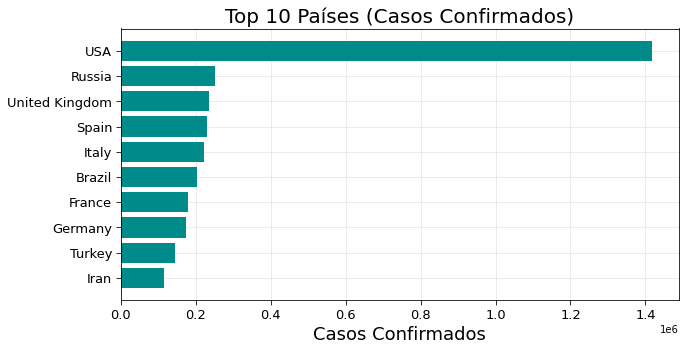

In [15]:
# Gráfico top 10 para los casos confirmados
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Confirmed')["Confirmed"].index[-10:],df_countries_cases.sort_values('Confirmed')["Confirmed"].values[-10:],color="darkcyan")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Casos Confirmados",fontsize=18)
plt.title("Top 10 Países (Casos Confirmados)",fontsize=20)
plt.grid(alpha=0.3)


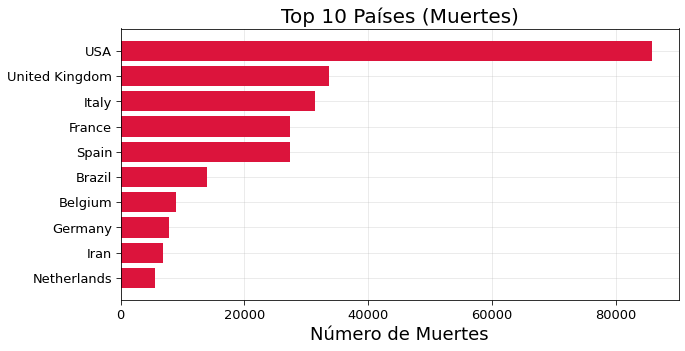

In [16]:
#Gráfico top 10 para el número de muertes
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Deaths')["Deaths"].index[-10:],df_countries_cases.sort_values('Deaths')["Deaths"].values[-10:],color="crimson")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Número de Muertes",fontsize=18)
plt.title("Top 10 Países (Muertes)",fontsize=20)
plt.grid(alpha=0.3,which='both')

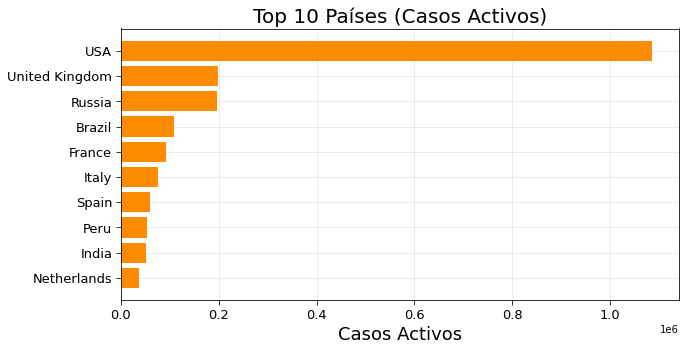

In [17]:
# Gráfico top 10 para los casos activos
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Active')["Active"].index[-10:],df_countries_cases.sort_values('Active')["Active"].values[-10:],color="darkorange")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Casos Activos",fontsize=18)
plt.title("Top 10 Países (Casos Activos)",fontsize=20)
plt.grid(alpha=0.3,which='both')

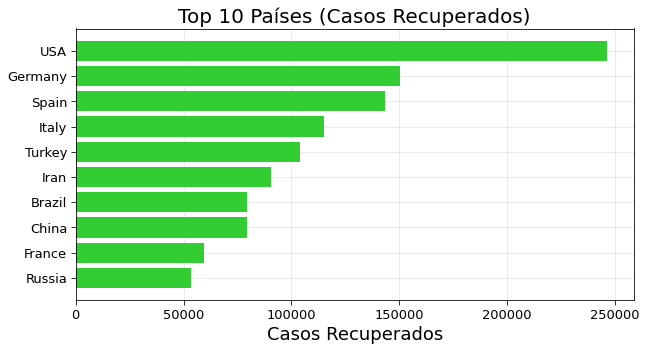

In [18]:
# Gráfico top 10 para los casos recuperados
f = plt.figure(figsize=(10,5))
f.add_subplot(111)

plt.axes(axisbelow=True)
plt.barh(df_countries_cases.sort_values('Recovered')["Recovered"].index[-10:],df_countries_cases.sort_values('Recovered')["Recovered"].values[-10:],color="limegreen")
plt.tick_params(size=5,labelsize = 13)
plt.xlabel("Casos Recuperados",fontsize=18)
plt.title("Top 10 Países (Casos Recuperados)",fontsize=20)
plt.grid(alpha=0.3,which='both')

Las visualizaciones geoespaciales del Coronavirus que más se han viralizado son como las del siguiente mapa, no obstante a cuando observamos a distancia no se aprecian bien los círculos en zonas con muchos países.

In [19]:
# Gráfico del COVID en mapa
world_map = folium.Map(location=[10,0], tiles="cartodbpositron", zoom_start=2,max_zoom=6,min_zoom=2)
for i in range(0,len(df_confirmed)):
    folium.Circle(
        location=[df_confirmed.iloc[i]['Lat'], df_confirmed.iloc[i]['Long']],
        tooltip = "<h5 style='text-align:center;font-weight: bold'>"+df_confirmed.iloc[i]['country']+"</h5>"+
                    "<div style='text-align:center;'>"+str(np.nan_to_num(df_confirmed.iloc[i]['state']))+"</div>"+
                    "<hr style='margin:10px;'>"+
                    "<ul style='color: #444;list-style-type:circle;align-item:left;padding-left:20px;padding-right:20px'>"+
        "<li>Confirmed: "+str(df_confirmed.iloc[i,-1])+"</li>"+
        "<li>Deaths:   "+str(df_deaths.iloc[i,-1])+"</li>"+
        "<li>Mortality Rate:   "+str(np.round(df_deaths.iloc[i,-1]/(df_confirmed.iloc[i,-1]+1.00001)*100,2))+"</li>"+
        "</ul>"
        ,
        radius=(int((np.log(df_confirmed.iloc[i,-1]+1.00001)))+0.2)*50000,
        color='#ff6600',
        fill_color='#ff8533',
        fill=True).add_to(world_map)

world_map

No obstante, si analizamos más en detalle la evolución del COVID-19 en el mismo tipo de mapa podemos notar que desde el 22 de Enero hasta el 22 de Febrero la expansión no era notoria, más bien solo se propagaba por China; 3 semanas tardo en consumir Europa, y en tan solo 15 días se propago tanto en América del Sur como en América del Norte.


In [20]:
# Gráfico de expansión del COVID 19 en mapa
df_data = df_table.groupby(['Last_Update', 'Country_Region'])['Confirmed', 'Deaths'].max().reset_index().fillna(0)
df_data["Last_Update"] = pd.to_datetime( df_data["Last_Update"]).dt.strftime('%m/%d/%Y')

fig = px.scatter_geo(df_data, locations="Country_Region", locationmode='country names', 
                     color=np.power(df_data["Confirmed"],0.3)-2 , size= np.power(df_data["Confirmed"]+1,0.3)-1, hover_name="Country_Region",
                     hover_data=["Confirmed"],
                     range_color= [0, max(np.power(df_data["Confirmed"],0.3))], 
                     projection="natural earth", animation_frame="Last_Update", 
                     color_continuous_scale=px.colors.sequential.Plasma,
                     title='COVID-19: Avance de la infección'
                    )
fig.update_coloraxes(colorscale="hot")
fig.update(layout_coloraxis_showscale=False)
fig.show()

Mirando ahora la serie temporal de países infectados alrededor del mundo, notamos que desde el 22 de Enero hasta el 22 de ebrero habían cerca de 35 países infectados solamente; luego en un mes esta cifra llego a mas de 150, para luego crecer de a poco en los países restantes.

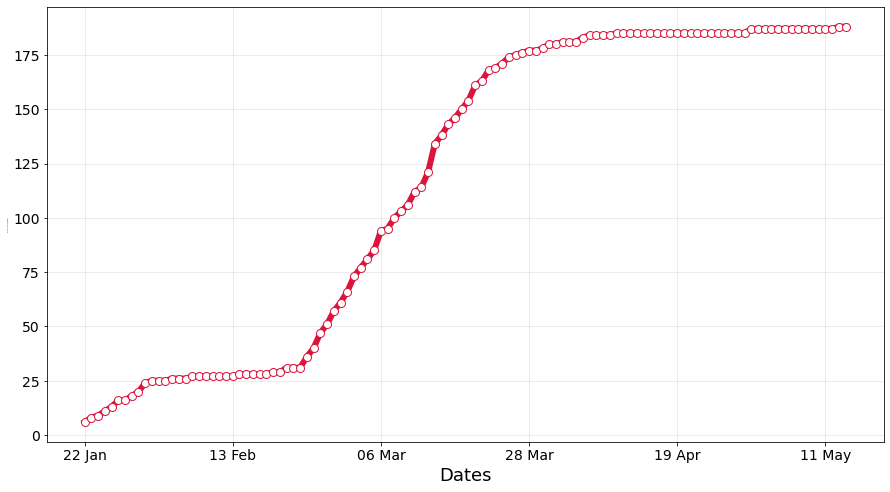

In [21]:
# Serie temporal países infectados

case_nums_country = df_confirmed.groupby("country").sum().drop(['Lat','Long'],axis =1).apply(lambda x: x[x > 0].count(), axis =0)
d = [datetime.strptime(date,'%m/%d/%y').strftime("%d %b") for date in case_nums_country.index]

f = plt.figure(figsize=(15,8))
f.add_subplot(111)
marker_style = dict(c="crimson",linewidth=6, linestyle='-', marker='o',markersize=8, markerfacecolor='#ffffff')
plt.plot(d, case_nums_country,**marker_style)
plt.tick_params(labelsize = 14)
plt.xticks(list(np.arange(0,len(d),int(len(d)/5))),d[:-1:int(len(d)/5)]+[d[-1]])

#labels
plt.xlabel("Dates",fontsize=18)
plt.ylabel("Number of Countries/Regions",fontsize=1)
plt.grid(alpha = 0.3)

plt.show()
plt.close()

Como se ve en el siguiente gráfico que superpone los casos confirmados con las muertes, existen dos tendencias que a priori parecen disintas, no obstante no se puede asegurar esto si no las analizamos localmente.

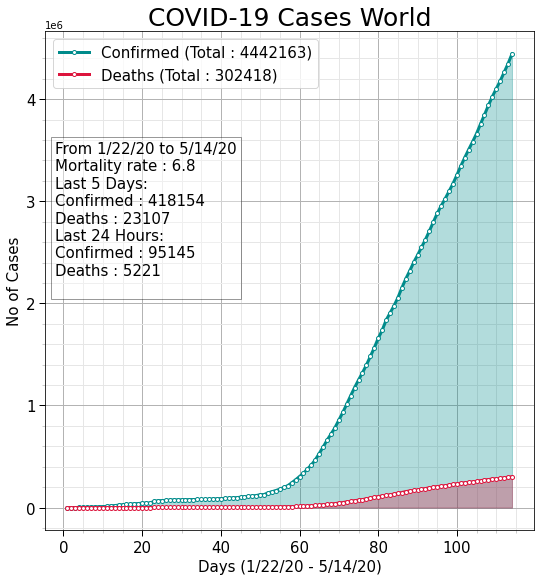

In [22]:
# Series temporales superpuestas: Confirmados sobre Muertes en el mundo
cols = 1
rows = 1
f = plt.figure(figsize=(10,10*rows))

visualize_covid_cases(df_confirmed, df_deaths,continent = "All",figure = [f,rows,cols, 1])

plt.show()

Abrimos por continente.

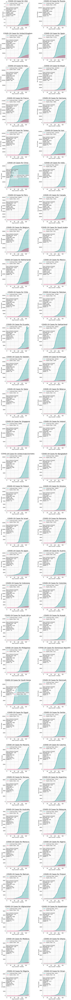

In [23]:
# Series temporales superpuestas: Confirmados sobre Muertes grupo países
df_countries = df_confirmed.groupby(["country"]).sum()
df_countries = df_countries.sort_values(df_countries.columns[-1],ascending = False)
countries = df_countries[df_countries[df_countries.columns[-1]] >= 4000].index

cols =2
rows = int(np.ceil(countries.shape[0]/cols))
f = plt.figure(figsize=(18,7*rows))
for i,country in enumerate(countries):
    visualize_covid_cases(df_confirmed, df_deaths,country = country,figure = [f,rows,cols, i+1])

plt.show()

Ahora por país

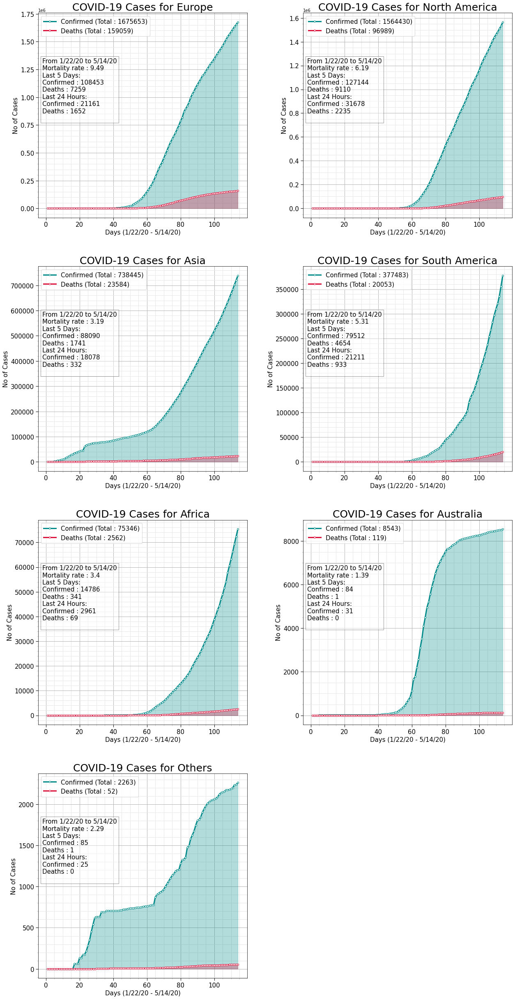

In [24]:
# Series temporales superpuestas: Confirmados sobre Muertes grupo Continente
df_continents= df_confirmed.groupby(["continent"]).sum()
continents = df_continents.sort_values(df_continents.columns[-1],ascending = False).index

cols =2
rows = int(np.ceil(continents.shape[0]/cols))
f = plt.figure(figsize=(20,9*rows))
for i,continent in enumerate(continents):
    visualize_covid_cases(df_confirmed, df_deaths, continent = continent,figure = [f,rows,cols, i+1])

plt.show()


Por último, podemos ver que el comportamiento es similar para el crecimiento de casos confirmados en casi todos los países observados, diferenciandose solamente en el tiempo de duplicación de casos.

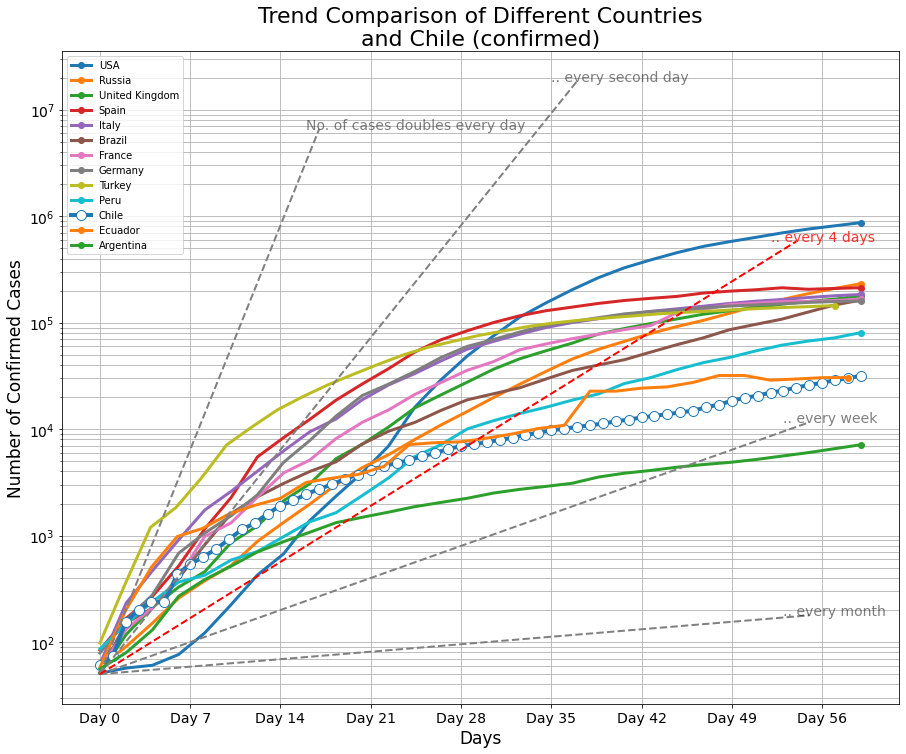

In [25]:
# Gráfico comparativo Chile vs otros Países, Casos Confirmados en Escala Logaritmica

temp = df_confirmed.groupby('country').sum().drop(["Lat","Long"],axis =1).sort_values(df_confirmed.columns[-1], ascending= False)

threshold = 50
f = plt.figure(figsize=(15,12))
ax = f.add_subplot(111)
for i,country in enumerate(temp.index):
    if i >= 9:
        if country != "Chile" and country != "Argentina" and country != "Peru" and country != "Ecuador":
            continue
    days = 60
    t = temp.loc[temp.index== country].values[0]
    t = t[t>threshold][:days]
     
    date = np.arange(0,len(t[:days]))
    xnew = np.linspace(date.min(), date.max(), 30)
    spl = make_interp_spline(date, t, k=1)  # type: BSpline
    power_smooth = spl(xnew)
    if country != "Chile":
        plt.plot(xnew,power_smooth,'-o',label = country,linewidth =3, markevery=[-1])
    else:
        marker_style = dict(linewidth=4, linestyle='-', marker='o',markersize=10, markerfacecolor='#ffffff')
        plt.plot(date,t,"-.",label = country,**marker_style)

plt.tick_params(labelsize = 14)        
plt.xticks(np.arange(0,days,7),[ "Day "+str(i) for i in range(days)][::7])     

# Reference lines 
x = np.arange(0,18)
y = 2**(x+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("No. of cases doubles every day",(x[-2],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,int(days-22))
y = 2**(x/2+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every second day",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,int(days-4))
y = 2**(x/7+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every week",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,int(days-4))
y = 2**(x/30+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every month",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)


# India is following trend similar to doulbe the cases in 4 days but it may increase the rate 
x = np.arange(0,int(days-5))
y = 2**(x/4+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "Red")
plt.annotate(".. every 4 days",(x[-3],y[-1]),color="Red",xycoords="data",fontsize=14,alpha = 0.8)

# plot Params
plt.xlabel("Days",fontsize=17)
plt.ylabel("Number of Confirmed Cases",fontsize=17)
plt.title("Trend Comparison of Different Countries\n and Chile (confirmed) ",fontsize=22)
plt.legend(loc = "upper left")
plt.yscale("log")
plt.grid(which="both")
plt.show()

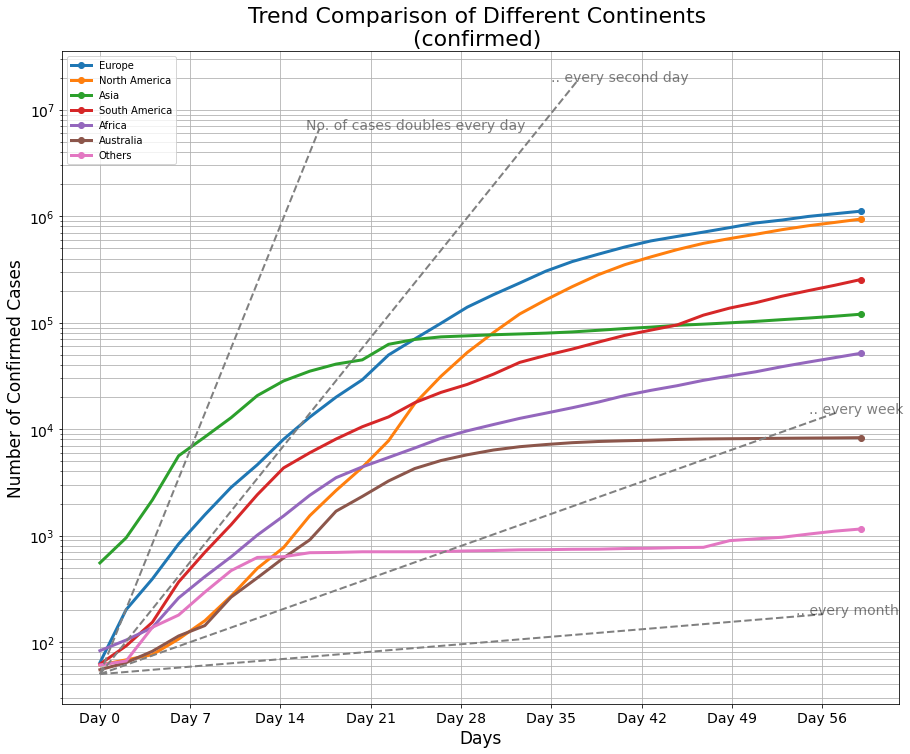

In [26]:
# Gráfico comparativo Continentes, Casos Confirmados (Escala Logaritmica)
temp = df_confirmed.groupby('continent').sum().drop(["Lat","Long"],axis =1).sort_values(df_confirmed.columns[-1], ascending= False)

threshold = 50
f = plt.figure(figsize=(15,12))
ax = f.add_subplot(111)
for i,country in enumerate(temp.index):
    if i >= 10:
        break
    days = 60
    t = temp.loc[temp.index== country].values[0]
    t = t[t>threshold][:days]
     
    date = np.arange(0,len(t[:days]))
    xnew = np.linspace(date.min(), date.max(), 30)
    spl = make_interp_spline(date, t, k=1)  # type: BSpline
    power_smooth = spl(xnew)
    plt.plot(xnew,power_smooth,'-o',label = country,linewidth =3, markevery=[-1])

plt.tick_params(labelsize = 14)        
plt.xticks(np.arange(0,days,7),[ "Day "+str(i) for i in range(days)][::7])     

# Reference lines 
x = np.arange(0,18)
y = 2**(x+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("No. of cases doubles every day",(x[-2],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,days-22)
y = 2**(x/2+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every second day",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,days-2)
y = 2**(x/7+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every week",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,days-3)
y = 2**(x/30+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every month",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)


# plot Params
plt.xlabel("Days",fontsize=17)
plt.ylabel("Number of Confirmed Cases",fontsize=17)
plt.title("Trend Comparison of Different Continents \n(confirmed) ",fontsize=22)
plt.legend(loc = "upper left")
plt.yscale("log")
plt.grid(which="both")
plt.show()

<a id="section4"></a>
<h2>4. Modelos </h2>
<hr>

<h3> 4.1 Modelo SIR </h3>
<hr>


Hemos visto un comportamiento general del virus en datos acordados, para el país donde se originó el coronavirus y para otros cuatro países interesantes. Hay mucha información para extraer de estos datos; por ejemplo, no hemos analizado los efectos de largo / lat de países. Sin embargo, dado que nuestro objetivo principal es desarrollar un modelo predectivo para comprender los factores clave que afectan la transmisión de COVID-19, pasaré a uno de los modelos epidemiológicos más famosos: SIR.

SIR es un modelo simple que considera una población que pertenece a uno de los siguientes estados:

1. **Susceptible (S):** La persona no ha contraído la enfermedad, pero puede infectarse debido a la transmisión de personas infectadas.

2. **Infectado (I):** La persona contrae la enfermedad.

3. **Recuperado/Fallecido (R):** La enfermedad puede conducir a uno de dos destinos: la persona sobrevive, por lo tanto, desarrolla inmunidad a la enfermedad o la persona ha fallecido.

<img src="https://www.lewuathe.com/assets/img/posts/2020-03-11-covid-19-dynamics-with-sir-model/sir.png" width="500px">


Existen muchas versiones de este modelo, considerando el nacimiento y la muerte (SIRD con demografía), con estados intermedios, etc. Sin embargo, dado que estamos en las primeras etapas de la expansión de COVID-19 y nuestro interés se centra en el corto plazo, nosotros considerará que las personas desarrollan inmunidad (a largo plazo, la inmunidad puede perderse y el COVID-19 puede regresar dentro de una determinada estacionalidad como la gripe común) y no hay transición de recuperación a los dos estados restantes. Con esto, las ecuaciones diferenciales que gobiernan el sistema son:

$$
\begin{align}
{dS \over dt} &= - \beta S I\\
{dI \over dt} &= \beta S I - \gamma I\\
{dR \over dt} &= \gamma I\\
\end{align}
$$

Donde $\beta$ es la tasa de contagio y $\gamma$ es la tasa de recuperación.

In [27]:
# Funciones para el modelo SIR

# Ecuación para susceptibles
def fa(N, a, b, beta):
    fa = -beta*a*b
    return fa

# Ecuación para infectados
def fb(N, a, b, beta, gamma):
    fb = beta*a*b - gamma*b
    return fb

# Ecuación para recuperados/muertos
def fc(N, b, gamma):
    fc = gamma*b
    return fc

# Runge-Kutta de 4to orden para 3 dimensiones
def rK4(N, a, b, c, fa, fb, fc, beta, gamma, hs):
    a1 = fa(N, a, b, beta)*hs
    b1 = fb(N, a, b, beta, gamma)*hs
    c1 = fc(N, b, gamma)*hs
    ak = a + a1*0.5
    bk = b + b1*0.5
    ck = c + c1*0.5
    a2 = fa(N, ak, bk, beta)*hs
    b2 = fb(N, ak, bk, beta, gamma)*hs
    c2 = fc(N, bk, gamma)*hs
    ak = a + a2*0.5
    bk = b + b2*0.5
    ck = c + c2*0.5
    a3 = fa(N, ak, bk, beta)*hs
    b3 = fb(N, ak, bk, beta, gamma)*hs
    c3 = fc(N, bk, gamma)*hs
    ak = a + a3
    bk = b + b3
    ck = c + c3
    a4 = fa(N, ak, bk, beta)*hs
    b4 = fb(N, ak, bk, beta, gamma)*hs
    c4 = fc(N, bk, gamma)*hs
    a = a + (a1 + 2*(a2 + a3) + a4)/6
    b = b + (b1 + 2*(b2 + b3) + b4)/6
    c = c + (c1 + 2*(c2 + c3) + c4)/6
    return a, b, c

# Ecuación para la evolución del SIR
def SIR(N, b0, beta, gamma, hs):
    
    """
    N = Población
    beta = Tasa de Transición S->I
    gamma = Tasa de transición I->R
    b0 =  denotes the constant degree distribution of the network (average value for networks in which 
    the probability of finding a node with a different connectivity decays exponentially fast
    hs = Salto para el Runge Kutta
    """
    
    # Initial condition
    a = float(N-1)/N -b0
    b = float(1)/N +b0
    c = 0.

    sus, inf, rec= [],[],[]
    for i in range(10000): # Run for a certain number of time-steps
        sus.append(a)
        inf.append(b)
        rec.append(c)
        a,b,c = rK4(N, a, b, c, fa, fb, fc, beta, gamma, hs)

    return sus, inf, rec

Habiendo definido las funciones requeridas para la aplicación del modelo, comenzamos con una implementación teórica.

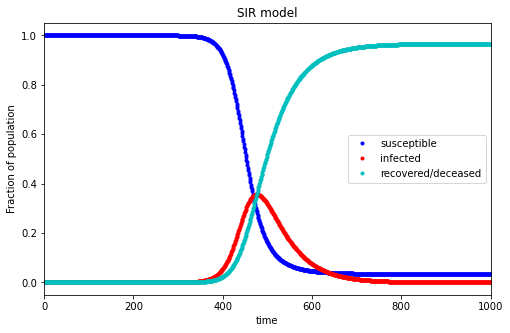

In [28]:
# Implementación teórica para el mundo
N = 7800*(10**6)
b0 = 0
beta = 0.7
gamma = 0.2
hs = 0.1

sus, inf, rec = SIR(N, b0, beta, gamma, hs)

f = plt.figure(figsize=(8,5)) 
plt.plot(sus, 'b.', label='susceptible');
plt.plot(inf, 'r.', label='infected');
plt.plot(rec, 'c.', label='recovered/deceased');
plt.title("SIR model")
plt.xlabel("time", fontsize=10);
plt.ylabel("Fraction of population", fontsize=10);
plt.legend(loc='best')
plt.xlim(0,1000)
plt.savefig('SIR_example.png')
plt.show()

**Observaciones**: 
* El numero de casos infectados crece en un principio, y eventualmente decrese ya que la gente comienza a recuperarse.
* The susceptible fraction of population decreases as the virus is transmited, to eventually drop to the absorbent state 0
* The oposite happens for the recovered/deceased case

Notice that different initial conditions and parameter values will lead to other scenarios, feel free to play with these numbers to study the system.
<hr>

El modelo SIR es puramente teórico, y estamos interesados en una aproximación real de la expansión COVID-19 para extraer información y comprender la transmisión del virus. Por lo tanto, necesitamos extraer los parámetros $\beta$ y $\gamma$ para cada caso si esperamos poder predecir la evolución del sistema.

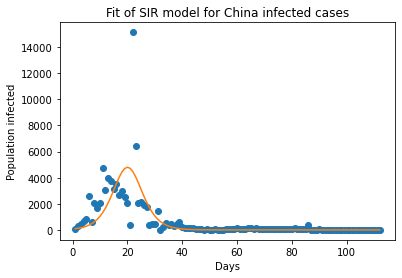

Optimal parameters: beta = 106.02033609752084  and gamma =  105.74491969860871


In [191]:
# Modelo SIR aplicado a China
population = float(1393000000)
country_df = pd.DataFrame()
country_df['Confirmed'] = df_data.loc[df_data['Country_Region']=='China'].Confirmed.diff().fillna(0)
country_df = country_df[1:]
country_df['day_count'] = list(range(1,len(country_df)+1))

ydata = [i for i in country_df.Confirmed]
xdata = country_df.day_count
ydata = np.array(ydata, dtype=float)
xdata = np.array(xdata, dtype=float)

N = population
inf0 = ydata[0]
sus0 = N - inf0
rec0 = 0.0

def sir_model(y, x, beta, gamma):
    sus = -beta * y[0] * y[1] / N
    rec = gamma * y[1]
    inf = -(sus + rec)
    return sus, inf, rec

def fit_odeint(x, beta, gamma):
    return integrate.odeint(sir_model, (sus0, inf0, rec0), x, args=(beta, gamma))[:,1]

popt, pcov = optimize.curve_fit(fit_odeint, xdata, ydata,maxfev=10000)
fitted = fit_odeint(xdata, *popt)

plt.plot(xdata, ydata, 'o')
plt.plot(xdata, fitted)
plt.title("Fit of SIR model for China infected cases")
plt.ylabel("Population infected")
plt.xlabel("Days")
plt.show()
print("Optimal parameters: beta =", popt[0], " and gamma = ", popt[1])

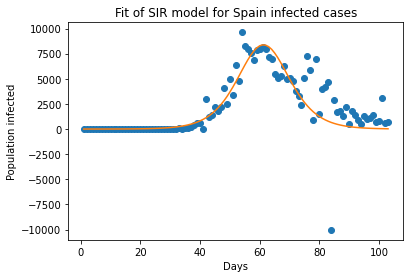

Optimal parameters: beta = 9.170561503281297  and gamma =  8.997484219714108


In [186]:
# Modelo SIR aplicado a España
population = float(46750238)
country_df = pd.DataFrame()
country_df['Confirmed'] = df_data.loc[df_data['Country_Region']=='Spain'].Confirmed.diff().fillna(0)
country_df = country_df[10:]
country_df['day_count'] = list(range(1,len(country_df)+1))

ydata = [i for i in country_df.Confirmed]
xdata = country_df.day_count
ydata = np.array(ydata, dtype=float)
xdata = np.array(xdata, dtype=float)

N = population
inf0 = ydata[0]
sus0 = N - inf0
rec0 = 0.0

def sir_model(y, x, beta, gamma):
    sus = -beta * y[0] * y[1] / N
    rec = gamma * y[1]
    inf = -(sus + rec)
    return sus, inf, rec

def fit_odeint(x, beta, gamma):
    return integrate.odeint(sir_model, (sus0, inf0, rec0), x, args=(beta, gamma))[:,1]

popt, pcov = optimize.curve_fit(fit_odeint, xdata, ydata,maxfev=10000)
fitted = fit_odeint(xdata, *popt)

plt.plot(xdata, ydata, 'o')
plt.plot(xdata, fitted)
plt.title("Fit of SIR model for Spain infected cases")
plt.ylabel("Population infected")
plt.xlabel("Days")
plt.show()
print("Optimal parameters: beta =", popt[0], " and gamma = ", popt[1])

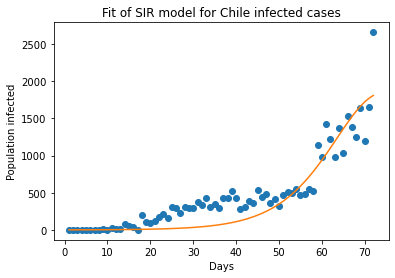

Optimal parameters: beta = 8.759121190694469  and gamma =  8.637666471346527


In [192]:
# Modelo SIR aplicado a Chile
population = float(19107216)
country_df = pd.DataFrame()
country_df['Confirmed'] = df_data.loc[df_data['Country_Region']=='Chile'].Confirmed.diff().fillna(0)
country_df = country_df[41:]
country_df['day_count'] = list(range(1,len(country_df)+1))

ydata = [i for i in country_df.Confirmed]
xdata = country_df.day_count
ydata = np.array(ydata, dtype=float)
xdata = np.array(xdata, dtype=float)

N = population
inf0 = ydata[0]
sus0 = N - inf0
rec0 = 0

def sir_model(y, x, beta, gamma):
    sus = -beta * y[0] * y[1] / N
    rec = gamma * y[1]
    inf = -(sus + rec)
    return sus, inf, rec

def fit_odeint(x, beta, gamma):
    return integrate.odeint(sir_model, (sus0, inf0, rec0), x, args=(beta, gamma))[:,1]

popt, pcov = optimize.curve_fit(fit_odeint, xdata, ydata)
fitted = fit_odeint(xdata, *popt)

plt.plot(xdata, ydata, 'o')
plt.plot(xdata, fitted)
plt.title("Fit of SIR model for Chile infected cases")
plt.ylabel("Population infected")
plt.xlabel("Days")
plt.show()
print("Optimal parameters: beta =", popt[0], " and gamma = ", popt[1])

Podemos inferir gracias al modelo SIR que China y USA se ajustan en cierta medida con sus datos, por lo que ya pasaron su periodo crítico, debiendo ahora establecer políticas públicas efectivas para contraer la enfermedad y no instar a un rebrote. En Chile es dificil inferir en que periodo nos encontramos, ya que estamos recien entrando en nuestros peak de contagios.

<h3> 4.2 Modelo Predictivo </h3>
<hr>
Antes de entrar al Machine Learning observemos la tendencia mundial del COVID19 al día de hoy. Siempre hay un patrón en cualquier dato, pero la preocupación es cuán fuertemente los datos siguen un patrón.


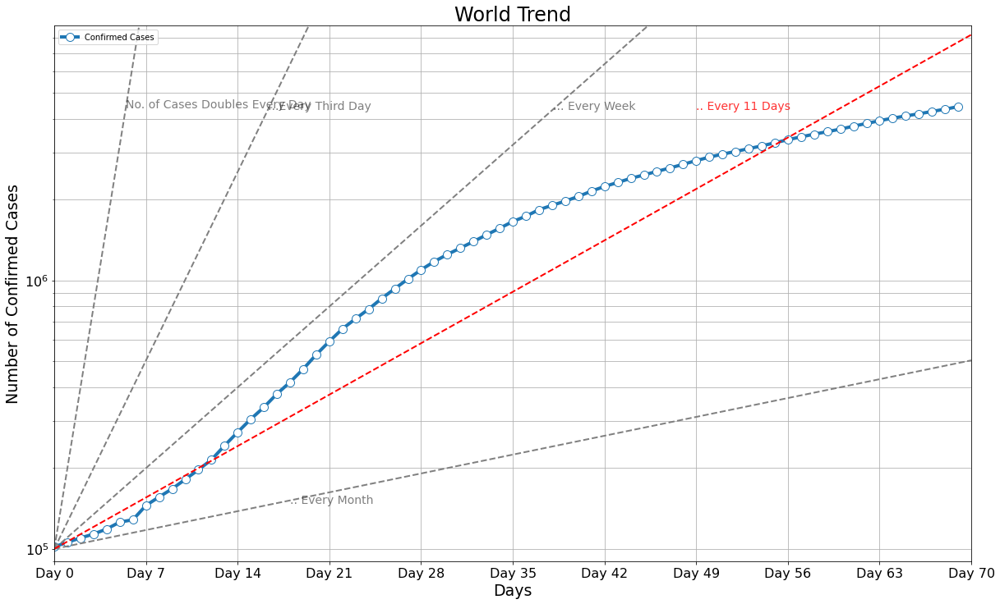

In [195]:
# Gráfico de tendencia en el mundo
temp_data = df_confirmed.iloc[:,5:].sum(axis =0)
f = plt.figure(figsize=(20,12))
f.add_subplot(111)

threshold = 100000

t = temp_data.values
t = t[t >threshold]

date = np.arange(0,len(t[:]))
xnew = np.linspace(date.min(), date.max(), 10)
spl = make_interp_spline(date, t, k=1)  # type: BSpline
power_smooth = spl(xnew)

marker_style = dict(linewidth=4, linestyle='-', marker='o',markersize=10, markerfacecolor='#ffffff')
plt.plot(date,t,"-.",label="Confirmed Cases",**marker_style)

days  = 80
# Reference lines 
x = np.arange(0,days)
y = 2**(x+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("No. of Cases Doubles Every Day",(np.log2((t.max()-threshold)/threshold),t.max()-threshold/2),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,days)
y = 2**(x/3+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("...Every Third Day",(np.log2((t.max()-threshold)/threshold)*3,t.max()-threshold),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,days)
y = 2**(x/7+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("... Every Week",(np.log2((t.max()-threshold)/threshold)*7,t.max()-threshold),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,days)
y = 2**(x/30+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. Every Month",(18,2**(17/30+np.log2(threshold))),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,days)
y = 2**(x/11+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "Red")
plt.annotate(".. Every 11 Days",(np.log2((t.max()-threshold)/threshold)*9,t.max()-threshold),color="Red",xycoords="data",fontsize=14,alpha = 0.8)


plt.xlim(date[0],date[-1])
plt.ylim(threshold - threshold/10,2*t.max())
# plot Params
# plt.tight_layout()
plt.tick_params(labelsize = 16)        
plt.xticks(np.arange(0,len(t[:])+7,7),[ "Day "+str(i) for i in range(len(t[:])+7)][::7]) 
plt.xlabel("Days",fontsize=19)
plt.ylabel("Number of Confirmed Cases",fontsize=19)
plt.title("World Trend",fontsize=24)
plt.legend(loc = "upper left")
plt.yscale("log")
plt.grid(which="both")
plt.show()

Construiremos una red neuronal para predecir los proximos 15 días en el mundo y en Chile. Cabe destacar entre otros aspectos que lo importante acá mas que las medidas de rendimiento es generar una predicción que 

In [199]:
# Construyendo la red neuronal y las variables

data_y = np.log10(np.asarray(df_confirmed.iloc[:,5:].sum(axis =0)).astype("float32"))
data_x = np.arange(1,len(data_y)+1)

Visible = Input(shape=(1,))
Dense_l1 = Dense(80,name="Dense_l1")(Visible)
LRelu_l1 = LeakyReLU(name = "LRelu_l1")(Dense_l1)
Dense_l2 = Dense(80,name = "Dense_l2")(LRelu_l1)
LRelu_l2 = LeakyReLU(name = "LRelu_l2")(Dense_l2)
Dense_l3 = Dense(80,name = "Dense_l3")(LRelu_l2)
LRelu_l3 = LeakyReLU(name = "LRelu_l3")(Dense_l3)
Dense_l4 = Dense(1,name="Dense_l4")(LRelu_l3)
LRelu_l4 = LeakyReLU(name = "Output")(Dense_l4
                                     )
model = models.Model(inputs=Visible, outputs=LRelu_l4)
model.compile(optimizer=Adam(lr=0.001), 
              loss='mean_squared_error',
              metrics=['accuracy'])
model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 1)                 0         
_________________________________________________________________
Dense_l1 (Dense)             (None, 80)                160       
_________________________________________________________________
LRelu_l1 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l2 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l2 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l3 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l3 (LeakyReLU)         (None, 80)                0   

In [201]:
# Entrenando el modelo

# epochs = 3000
# model.fit(data_x.reshape([data_y.shape[0],1]),data_y.reshape([data_y.shape[0],1]),epochs=epochs)
# model.save('model_15052020.h5')

Epoch 1/3000
114/114 [==============================] - 0s 101us/step - loss: 0.0302 - accuracy: 0.0000e+00
Epoch 2/3000
114/114 [==============================] - 0s 88us/step - loss: 0.0277 - accuracy: 0.0000e+00
Epoch 3/3000
114/114 [==============================] - 0s 114us/step - loss: 0.0230 - accuracy: 0.0000e+00
Epoch 4/3000
114/114 [==============================] - 0s 96us/step - loss: 0.0192 - accuracy: 0.0000e+00
Epoch 5/3000
114/114 [==============================] - 0s 114us/step - loss: 0.0233 - accuracy: 0.0000e+00
Epoch 6/3000
114/114 [==============================] - 0s 97us/step - loss: 0.0268 - accuracy: 0.0000e+00
Epoch 7/3000
114/114 [==============================] - 0s 96us/step - loss: 0.0369 - accuracy: 0.0000e+00
Epoch 8/3000
114/114 [==============================] - 0s 114us/step - loss: 0.0579 - accuracy: 0.0000e+00
Epoch 9/3000
114/114 [==============================] - 0s 97us/step - loss: 0.0494 - accuracy: 0.0000e+00
Epoch 10/3000
114/114 [==========

Epoch 76/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0208 - accuracy: 0.0000e+00
Epoch 77/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0309 - accuracy: 0.0000e+00
Epoch 78/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0247 - accuracy: 0.0000e+00
Epoch 79/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0382 - accuracy: 0.0000e+00
Epoch 80/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0371 - accuracy: 0.0000e+00
Epoch 81/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0256 - accuracy: 0.0000e+00
Epoch 82/3000
114/114 [==============================] - 0s 88us/step - loss: 0.0314 - accuracy: 0.0000e+00
Epoch 83/3000
114/114 [==============================] - 0s 88us/step - loss: 0.0223 - accuracy: 0.0000e+00
Epoch 84/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0145 - accuracy: 0.0000e+00
Epoch 85/3000
114/114 [=====

114/114 [==============================] - 0s 79us/step - loss: 0.0149 - accuracy: 0.0000e+00
Epoch 227/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0206 - accuracy: 0.0000e+00
Epoch 228/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0248 - accuracy: 0.0000e+00
Epoch 229/3000
114/114 [==============================] - 0s 88us/step - loss: 0.0223 - accuracy: 0.0000e+00
Epoch 230/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0272 - accuracy: 0.0000e+00
Epoch 231/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0163 - accuracy: 0.0000e+00
Epoch 232/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0240 - accuracy: 0.0000e+00
Epoch 233/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0148 - accuracy: 0.0000e+00
Epoch 234/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0122 - accuracy: 0.0000e+00
Epoch 235/3000
114/114 [==========

114/114 [==============================] - 0s 79us/step - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 377/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 378/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 379/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0131 - accuracy: 0.0000e+00
Epoch 380/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0133 - accuracy: 0.0000e+00
Epoch 381/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0200 - accuracy: 0.0000e+00
Epoch 382/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0122 - accuracy: 0.0000e+00
Epoch 383/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0119 - accuracy: 0.0000e+00
Epoch 384/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0095 - accuracy: 0.0000e+00
Epoch 385/3000
114/114 [==========

114/114 [==============================] - 0s 105us/step - loss: 0.0099 - accuracy: 0.0000e+00
Epoch 451/3000
114/114 [==============================] - 0s 105us/step - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 452/3000
114/114 [==============================] - 0s 88us/step - loss: 0.0128 - accuracy: 0.0000e+00
Epoch 453/3000
114/114 [==============================] - 0s 105us/step - loss: 0.0136 - accuracy: 0.0000e+00
Epoch 454/3000
114/114 [==============================] - 0s 97us/step - loss: 0.0197 - accuracy: 0.0000e+00
Epoch 455/3000
114/114 [==============================] - 0s 96us/step - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 456/3000
114/114 [==============================] - 0s 105us/step - loss: 0.0152 - accuracy: 0.0000e+00
Epoch 457/3000
114/114 [==============================] - 0s 97us/step - loss: 0.0197 - accuracy: 0.0000e+00
Epoch 458/3000
114/114 [==============================] - ETA: 0s - loss: 0.0261 - accuracy: 0.0000e+ - 0s 114us/step - loss: 0.0177 - accu

114/114 [==============================] - 0s 96us/step - loss: 0.0121 - accuracy: 0.0000e+00
Epoch 598/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 599/3000
114/114 [==============================] - 0s 61us/step - loss: 0.0522 - accuracy: 0.0000e+00
Epoch 600/3000
114/114 [==============================] - 0s 97us/step - loss: 0.0715 - accuracy: 0.0000e+00
Epoch 601/3000
114/114 [==============================] - 0s 88us/step - loss: 0.0357 - accuracy: 0.0000e+00
Epoch 602/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0288 - accuracy: 0.0000e+00
Epoch 603/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0218 - accuracy: 0.0000e+00
Epoch 604/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0170 - accuracy: 0.0000e+00
Epoch 605/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0109 - accuracy: 0.0000e+00
Epoch 606/3000
114/114 [==========

114/114 [==============================] - 0s 88us/step - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 748/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 749/3000
114/114 [==============================] - 0s 61us/step - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 750/3000
114/114 [==============================] - 0s 88us/step - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 751/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 752/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 753/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 754/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 755/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 756/3000
114/114 [==========

114/114 [==============================] - 0s 70us/step - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 897/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 898/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 899/3000
114/114 [==============================] - 0s 127us/step - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 900/3000
114/114 [==============================] - 0s 96us/step - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 901/3000
114/114 [==============================] - 0s 149us/step - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 902/3000
114/114 [==============================] - 0s 88us/step - loss: 9.3987e-04 - accuracy: 0.0000e+00
Epoch 903/3000
114/114 [==============================] - 0s 105us/step - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 904/3000
114/114 [==============================] - 0s 88us/step - loss: 0.0010 - accuracy: 0.0000e+00
Epoch 905/3000
114/114 [===

114/114 [==============================] - 0s 79us/step - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 1044/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 1045/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 1046/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 1047/3000
114/114 [==============================] - 0s 61us/step - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 1048/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 1049/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 1050/3000
114/114 [==============================] - 0s 61us/step - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 1051/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 1052/3000
114/114 [=

114/114 [==============================] - 0s 70us/step - loss: 8.7565e-04 - accuracy: 0.0000e+00
Epoch 1191/3000
114/114 [==============================] - 0s 61us/step - loss: 9.7228e-04 - accuracy: 0.0000e+00
Epoch 1192/3000
114/114 [==============================] - 0s 61us/step - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 1193/3000
114/114 [==============================] - 0s 61us/step - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 1194/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 1195/3000
114/114 [==============================] - 0s 61us/step - loss: 8.7196e-04 - accuracy: 0.0000e+00
Epoch 1196/3000
114/114 [==============================] - 0s 61us/step - loss: 6.7229e-04 - accuracy: 0.0000e+00
Epoch 1197/3000
114/114 [==============================] - 0s 70us/step - loss: 8.2360e-04 - accuracy: 0.0000e+00
Epoch 1198/3000
114/114 [==============================] - 0s 53us/step - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 

114/114 [==============================] - 0s 88us/step - loss: 7.2463e-04 - accuracy: 0.0000e+00
Epoch 1337/3000
114/114 [==============================] - 0s 79us/step - loss: 7.6502e-04 - accuracy: 0.0000e+00
Epoch 1338/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 1339/3000
114/114 [==============================] - 0s 88us/step - loss: 5.3423e-04 - accuracy: 0.0000e+00
Epoch 1340/3000
114/114 [==============================] - 0s 88us/step - loss: 4.4910e-04 - accuracy: 0.0000e+00
Epoch 1341/3000
114/114 [==============================] - 0s 70us/step - loss: 3.8356e-04 - accuracy: 0.0000e+00
Epoch 1342/3000
114/114 [==============================] - 0s 79us/step - loss: 5.1244e-04 - accuracy: 0.0000e+00
Epoch 1343/3000
114/114 [==============================] - 0s 79us/step - loss: 3.8468e-04 - accuracy: 0.0000e+00
Epoch 1344/3000
114/114 [==============================] - 0s 70us/step - loss: 4.1646e-04 - accuracy: 0.000

114/114 [==============================] - 0s 70us/step - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 1481/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 1482/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 1483/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 1484/3000
114/114 [==============================] - 0s 70us/step - loss: 8.5576e-04 - accuracy: 0.0000e+00
Epoch 1485/3000
114/114 [==============================] - 0s 79us/step - loss: 9.4342e-04 - accuracy: 0.0000e+00
Epoch 1486/3000
114/114 [==============================] - 0s 79us/step - loss: 4.9489e-04 - accuracy: 0.0000e+00
Epoch 1487/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 1488/3000
114/114 [==============================] - 0s 79us/step - loss: 6.3678e-04 - accuracy: 0.0000e+00
Epoch 1489

114/114 [==============================] - 0s 105us/step - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 1555/3000
114/114 [==============================] - 0s 105us/step - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 1556/3000
114/114 [==============================] - 0s 97us/step - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 1557/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 1558/3000
114/114 [==============================] - 0s 88us/step - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 1559/3000
114/114 [==============================] - 0s 88us/step - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 1560/3000
114/114 [==============================] - 0s 88us/step - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 1561/3000
114/114 [==============================] - 0s 97us/step - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 1562/3000
114/114 [==============================] - 0s 123us/step - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 1563/3000
114/114

114/114 [==============================] - 0s 70us/step - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 1699/3000
114/114 [==============================] - 0s 79us/step - loss: 4.0367e-04 - accuracy: 0.0000e+00
Epoch 1700/3000
114/114 [==============================] - 0s 88us/step - loss: 4.1227e-04 - accuracy: 0.0000e+00
Epoch 1701/3000
114/114 [==============================] - 0s 79us/step - loss: 4.8313e-04 - accuracy: 0.0000e+00
Epoch 1702/3000
114/114 [==============================] - 0s 79us/step - loss: 5.2323e-04 - accuracy: 0.0000e+00
Epoch 1703/3000
114/114 [==============================] - 0s 88us/step - loss: 5.2098e-04 - accuracy: 0.0000e+00
Epoch 1704/3000
114/114 [==============================] - 0s 79us/step - loss: 4.6075e-04 - accuracy: 0.0000e+00
Epoch 1705/3000
114/114 [==============================] - 0s 79us/step - loss: 7.0906e-04 - accuracy: 0.0000e+00
Epoch 1706/3000
114/114 [==============================] - 0s 79us/step - loss: 6.0453e-04 - accuracy: 0.000

114/114 [==============================] - 0s 70us/step - loss: 4.6827e-04 - accuracy: 0.0000e+00
Epoch 1844/3000
114/114 [==============================] - 0s 88us/step - loss: 4.9176e-04 - accuracy: 0.0000e+00
Epoch 1845/3000
114/114 [==============================] - 0s 79us/step - loss: 5.5317e-04 - accuracy: 0.0000e+00
Epoch 1846/3000
114/114 [==============================] - 0s 70us/step - loss: 8.9014e-04 - accuracy: 0.0000e+00
Epoch 1847/3000
114/114 [==============================] - 0s 88us/step - loss: 8.4568e-04 - accuracy: 0.0000e+00
Epoch 1848/3000
114/114 [==============================] - 0s 79us/step - loss: 3.6549e-04 - accuracy: 0.0000e+00
Epoch 1849/3000
114/114 [==============================] - 0s 70us/step - loss: 3.2486e-04 - accuracy: 0.0000e+00
Epoch 1850/3000
114/114 [==============================] - 0s 79us/step - loss: 3.0688e-04 - accuracy: 0.0000e+00
Epoch 1851/3000
114/114 [==============================] - 0s 70us/step - loss: 2.4330e-04 - accuracy: 0

114/114 [==============================] - 0s 79us/step - loss: 7.1048e-04 - accuracy: 0.0000e+00
Epoch 1989/3000
114/114 [==============================] - 0s 88us/step - loss: 6.9984e-04 - accuracy: 0.0000e+00
Epoch 1990/3000
114/114 [==============================] - 0s 70us/step - loss: 4.8540e-04 - accuracy: 0.0000e+00
Epoch 1991/3000
114/114 [==============================] - 0s 70us/step - loss: 4.2014e-04 - accuracy: 0.0000e+00
Epoch 1992/3000
114/114 [==============================] - 0s 145us/step - loss: 3.8064e-04 - accuracy: 0.0000e+00
Epoch 1993/3000
114/114 [==============================] - 0s 70us/step - loss: 4.3904e-04 - accuracy: 0.0000e+00
Epoch 1994/3000
114/114 [==============================] - 0s 79us/step - loss: 5.2808e-04 - accuracy: 0.0000e+00
Epoch 1995/3000
114/114 [==============================] - 0s 70us/step - loss: 5.8453e-04 - accuracy: 0.0000e+00
Epoch 1996/3000
114/114 [==============================] - 0s 79us/step - loss: 6.4997e-04 - accuracy: 

114/114 [==============================] - 0s 70us/step - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 2133/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 2134/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 2135/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 2136/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 2137/3000
114/114 [==============================] - 0s 80us/step - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 2138/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 2139/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 2140/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 2141/3000
114/114 [=

114/114 [==============================] - 0s 70us/step - loss: 0.0142 - accuracy: 0.0000e+00
Epoch 2277/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0198 - accuracy: 0.0000e+00
Epoch 2278/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0209 - accuracy: 0.0000e+00
Epoch 2279/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0313 - accuracy: 0.0000e+00
Epoch 2280/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0188 - accuracy: 0.0000e+00
Epoch 2281/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0416 - accuracy: 0.0000e+00
Epoch 2282/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0169 - accuracy: 0.0000e+00
Epoch 2283/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 2284/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 2285/3000
114/114 [=

114/114 [==============================] - 0s 79us/step - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 2423/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 2424/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 2425/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 2426/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0116 - accuracy: 0.0000e+00
Epoch 2427/3000
114/114 [==============================] - 0s 88us/step - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 2428/3000
114/114 [==============================] - 0s 88us/step - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 2429/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 2430/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 2431/3000
114/114 [=

114/114 [==============================] - 0s 70us/step - loss: 2.2333e-04 - accuracy: 0.0000e+00
Epoch 2566/3000
114/114 [==============================] - 0s 79us/step - loss: 2.1212e-04 - accuracy: 0.0000e+00
Epoch 2567/3000
114/114 [==============================] - 0s 79us/step - loss: 2.7100e-04 - accuracy: 0.0000e+00
Epoch 2568/3000
114/114 [==============================] - 0s 88us/step - loss: 2.0991e-04 - accuracy: 0.0000e+00
Epoch 2569/3000
114/114 [==============================] - 0s 79us/step - loss: 2.4657e-04 - accuracy: 0.0000e+00
Epoch 2570/3000
114/114 [==============================] - 0s 79us/step - loss: 2.5326e-04 - accuracy: 0.0000e+00
Epoch 2571/3000
114/114 [==============================] - 0s 79us/step - loss: 2.8587e-04 - accuracy: 0.0000e+00
Epoch 2572/3000
114/114 [==============================] - 0s 97us/step - loss: 2.4689e-04 - accuracy: 0.0000e+00
Epoch 2573/3000
114/114 [==============================] - 0s 97us/step - loss: 2.1016e-04 - accuracy: 0

Epoch 2637/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 2638/3000
114/114 [==============================] - 0s 89us/step - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 2639/3000
114/114 [==============================] - 0s 105us/step - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 2640/3000
114/114 [==============================] - 0s 114us/step - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 2641/3000
114/114 [==============================] - 0s 97us/step - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 2642/3000
114/114 [==============================] - 0s 96us/step - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 2643/3000
114/114 [==============================] - 0s 105us/step - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 2644/3000
114/114 [==============================] - 0s 105us/step - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 2645/3000
114/114 [==============================] - 0s 97us/step - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 

114/114 [==============================] - 0s 88us/step - loss: 3.5264e-04 - accuracy: 0.0000e+00
Epoch 2782/3000
114/114 [==============================] - 0s 70us/step - loss: 4.6794e-04 - accuracy: 0.0000e+00
Epoch 2783/3000
114/114 [==============================] - 0s 79us/step - loss: 4.3191e-04 - accuracy: 0.0000e+00
Epoch 2784/3000
114/114 [==============================] - 0s 83us/step - loss: 3.4319e-04 - accuracy: 0.0000e+00
Epoch 2785/3000
114/114 [==============================] - 0s 79us/step - loss: 4.4863e-04 - accuracy: 0.0000e+00
Epoch 2786/3000
114/114 [==============================] - 0s 79us/step - loss: 2.7122e-04 - accuracy: 0.0000e+00
Epoch 2787/3000
114/114 [==============================] - 0s 79us/step - loss: 3.1953e-04 - accuracy: 0.0000e+00
Epoch 2788/3000
114/114 [==============================] - 0s 79us/step - loss: 3.0099e-04 - accuracy: 0.0000e+00
Epoch 2789/3000
114/114 [==============================] - 0s 70us/step - loss: 2.3450e-04 - accuracy: 0

114/114 [==============================] - 0s 70us/step - loss: 3.7650e-04 - accuracy: 0.0000e+00
Epoch 2927/3000
114/114 [==============================] - 0s 88us/step - loss: 4.4935e-04 - accuracy: 0.0000e+00
Epoch 2928/3000
114/114 [==============================] - 0s 70us/step - loss: 5.9697e-04 - accuracy: 0.0000e+00
Epoch 2929/3000
114/114 [==============================] - 0s 79us/step - loss: 8.0141e-04 - accuracy: 0.0000e+00
Epoch 2930/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 2931/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 2932/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 2933/3000
114/114 [==============================] - 0s 79us/step - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 2934/3000
114/114 [==============================] - 0s 70us/step - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 2935

114/114 [==============================] - 0s 79us/step - loss: 7.4422e-04 - accuracy: 0.0000e+00
Epoch 2999/3000
114/114 [==============================] - 0s 79us/step - loss: 6.6959e-04 - accuracy: 0.0000e+00
Epoch 3000/3000
114/114 [==============================] - 0s 70us/step - loss: 9.9981e-04 - accuracy: 0.0000e+00


In [203]:
# Cargando el modelo ya construido

model = models.load_model("model_15052020.h5")
model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 1)                 0         
_________________________________________________________________
Dense_l1 (Dense)             (None, 80)                160       
_________________________________________________________________
LRelu_l1 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l2 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l2 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l3 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l3 (LeakyReLU)         (None, 80)                0   

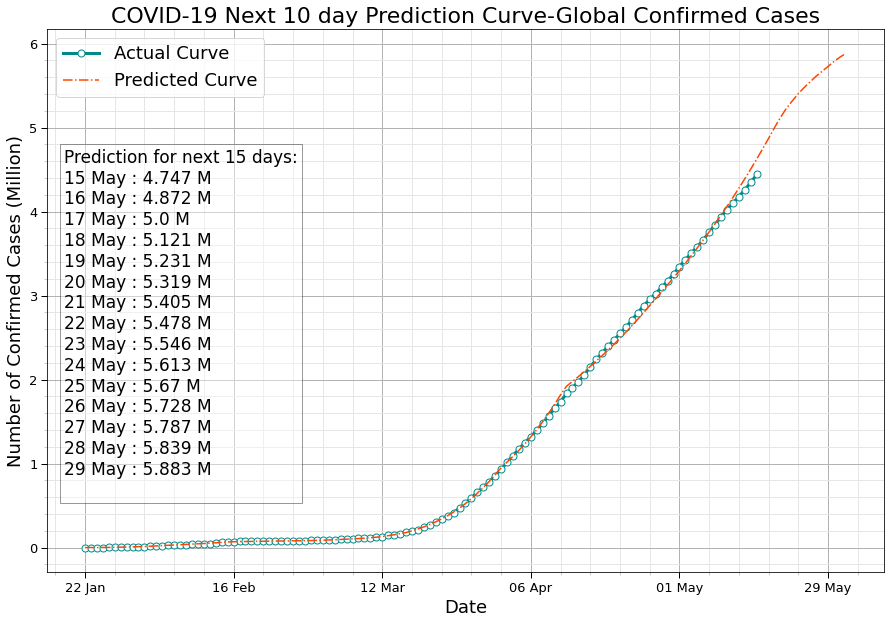

In [210]:
# Gráficando la predicción de nuestra red neuronal

lakh = 1000000
prediction_days = 15

temp_data = df_confirmed.iloc[:,5:].sum(axis =0)
data = np.power(10,model.predict(np.arange(1,len(temp_data)+prediction_days+1)))
f = plt.figure(figsize=(15,10))
ax = f.add_subplot(111)

date = np.arange(0,len(temp_data))

marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=7, markerfacecolor='#ffffff')
plt.plot(date,temp_data/lakh,"-.",color="darkcyan",**marker_style, label="Actual Curve")

date = np.arange(0,len(data))
plt.plot(date,data/lakh,"-.",color="orangered",label="Predicted Curve")

nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total = d + nextdays

text = "Prediction for next "+str(prediction_days) +" days:\n"
for i in range(prediction_days):
    text += nextdays[i]+" : "+str(np.round(data[-1*(prediction_days-i)],-3)[0]/lakh)+" M\n"

plt.text(0.02, 0.78, text, fontsize=17, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),d[:-1:int(len(total)/5)]+[total[-1]])

# Tick-Parameters
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(which='both', width=1,labelsize=14)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=3, color='0.8')

# Grid
plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')
plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')

# Plot Title
plt.title("COVID-19 Next 10 day Prediction Curve-Global Confirmed Cases",{'fontsize':22})

# Axis Lable
plt.xlabel("Date",fontsize =18)
plt.ylabel("Number of Confirmed Cases (Million)",fontsize =18)

# plt.yscale("log")
plt.legend(fontsize =18)
plt.tick_params(labelsize = 13) 
plt.show()

In [232]:
# Nuevo modelo para Chile

data_y = np.log10(np.asarray(df_confirmed[df_confirmed["country"]=="Chile"].iloc[:,5:].sum(axis =0)).astype("float32"))[51:]
data_x = np.arange(1,len(data_y)+1)

Visible = Input(shape=(1,))
Dense_l1 = Dense(80,name="Dense_l1")(Visible)
LRelu_l1 = LeakyReLU(name = "LRelu_l1")(Dense_l1)
Dense_l2 = Dense(80,name = "Dense_l2")(LRelu_l1)
LRelu_l2 = LeakyReLU(name = "LRelu_l2")(Dense_l2)
Dense_l3 = Dense(80,name = "Dense_l3")(LRelu_l2)
LRelu_l3 = LeakyReLU(name = "LRelu_l3")(Dense_l3)
Dense_l4 = Dense(1,name="Dense_l4")(LRelu_l3)
LRelu_l4 = LeakyReLU(name = "Output")(Dense_l4
                                     )
model = models.Model(inputs=Visible, outputs=LRelu_l4)
model.compile(optimizer=Adam(lr=0.001), 
              loss='mean_squared_error',
              metrics=['accuracy'])
model.summary()

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         (None, 1)                 0         
_________________________________________________________________
Dense_l1 (Dense)             (None, 80)                160       
_________________________________________________________________
LRelu_l1 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l2 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l2 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l3 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l3 (LeakyReLU)         (None, 80)                0   

In [230]:
# Entrenando el nuevo modelo

epochs = 1000
model.fit(data_x.reshape([data_y.shape[0],1]),data_y.reshape([data_y.shape[0],1]),epochs=epochs)
model.save('model_15052020_Chile.h5')

Epoch 1/1000
73/73 [==============================] - 0s 3ms/step - loss: 0.0015 - accuracy: 0.0274
Epoch 2/1000
73/73 [==============================] - 0s 123us/step - loss: 0.0015 - accuracy: 0.0274
Epoch 3/1000
73/73 [==============================] - 0s 96us/step - loss: 0.0014 - accuracy: 0.0274   
Epoch 4/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0016 - accuracy: 0.0274
Epoch 5/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0017 - accuracy: 0.0274
Epoch 6/1000
73/73 [==============================] - 0s 96us/step - loss: 0.0018 - accuracy: 0.0274
Epoch 7/1000
73/73 [==============================] - 0s 137us/step - loss: 0.0017 - accuracy: 0.0274
Epoch 8/1000
73/73 [==============================] - 0s 123us/step - loss: 0.0018 - accuracy: 0.0274
Epoch 9/1000
73/73 [==============================] - 0s 123us/step - loss: 0.0019 - accuracy: 0.0274
Epoch 10/1000
73/73 [==============================] - 0s 123us/step - loss: 0.0022

73/73 [==============================] - 0s 96us/step - loss: 0.0030 - accuracy: 0.0274
Epoch 160/1000
73/73 [==============================] - 0s 123us/step - loss: 0.0023 - accuracy: 0.0274
Epoch 161/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0024 - accuracy: 0.0274
Epoch 162/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0018 - accuracy: 0.0274
Epoch 163/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0018 - accuracy: 0.0274
Epoch 164/1000
73/73 [==============================] - 0s 96us/step - loss: 0.0016 - accuracy: 0.0274
Epoch 165/1000
73/73 [==============================] - 0s 96us/step - loss: 0.0016 - accuracy: 0.0274
Epoch 166/1000
73/73 [==============================] - 0s 123us/step - loss: 0.0016 - accuracy: 0.0274
Epoch 167/1000
73/73 [==============================] - 0s 96us/step - loss: 0.0015 - accuracy: 0.0274
Epoch 168/1000
73/73 [==============================] - 0s 110us/step - loss: 0.001

73/73 [==============================] - 0s 96us/step - loss: 0.0014 - accuracy: 0.0274
Epoch 316/1000
73/73 [==============================] - 0s 123us/step - loss: 0.0017 - accuracy: 0.0274
Epoch 317/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0016 - accuracy: 0.0274
Epoch 318/1000
73/73 [==============================] - 0s 137us/step - loss: 0.0015 - accuracy: 0.0274
Epoch 319/1000
73/73 [==============================] - 0s 96us/step - loss: 0.0016 - accuracy: 0.0274
Epoch 320/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0017 - accuracy: 0.0274
Epoch 321/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0015 - accuracy: 0.0274
Epoch 322/1000
73/73 [==============================] - 0s 96us/step - loss: 0.0017 - accuracy: 0.0274
Epoch 323/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0019 - accuracy: 0.0274  
Epoch 324/1000
73/73 [==============================] - 0s 96us/step - loss: 0.0

73/73 [==============================] - 0s 96us/step - loss: 0.0190 - accuracy: 0.0274
Epoch 395/1000
73/73 [==============================] - 0s 123us/step - loss: 0.0092 - accuracy: 0.0274
Epoch 396/1000
73/73 [==============================] - 0s 96us/step - loss: 0.0190 - accuracy: 0.0274
Epoch 397/1000
73/73 [==============================] - 0s 123us/step - loss: 0.0161 - accuracy: 0.0274
Epoch 398/1000
73/73 [==============================] - 0s 96us/step - loss: 0.0184 - accuracy: 0.0274
Epoch 399/1000
73/73 [==============================] - 0s 96us/step - loss: 0.0103 - accuracy: 0.0274
Epoch 400/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0223 - accuracy: 0.0274
Epoch 401/1000
73/73 [==============================] - 0s 123us/step - loss: 0.0401 - accuracy: 0.0274
Epoch 402/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0358 - accuracy: 0.0274
Epoch 403/1000
73/73 [==============================] - 0s 110us/step - loss: 0.045

73/73 [==============================] - 0s 110us/step - loss: 0.0018 - accuracy: 0.0274  
Epoch 474/1000
73/73 [==============================] - 0s 96us/step - loss: 0.0021 - accuracy: 0.0274
Epoch 475/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0024 - accuracy: 0.0274
Epoch 476/1000
73/73 [==============================] - 0s 82us/step - loss: 0.0029 - accuracy: 0.0274
Epoch 477/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0024 - accuracy: 0.0274
Epoch 478/1000
73/73 [==============================] - 0s 96us/step - loss: 0.0034 - accuracy: 0.0274
Epoch 479/1000
73/73 [==============================] - 0s 96us/step - loss: 0.0025 - accuracy: 0.0274
Epoch 480/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0033 - accuracy: 0.0274
Epoch 481/1000
73/73 [==============================] - 0s 82us/step - loss: 0.0025 - accuracy: 0.0274
Epoch 482/1000
73/73 [==============================] - 0s 110us/step - loss: 0.00

73/73 [==============================] - 0s 96us/step - loss: 0.0015 - accuracy: 0.0274
Epoch 631/1000
73/73 [==============================] - 0s 96us/step - loss: 0.0015 - accuracy: 0.0274
Epoch 632/1000
73/73 [==============================] - 0s 96us/step - loss: 0.0016 - accuracy: 0.0274
Epoch 633/1000
73/73 [==============================] - 0s 96us/step - loss: 0.0019 - accuracy: 0.0274
Epoch 634/1000
73/73 [==============================] - 0s 96us/step - loss: 0.0018 - accuracy: 0.0274
Epoch 635/1000
73/73 [==============================] - 0s 96us/step - loss: 0.0015 - accuracy: 0.0274
Epoch 636/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0020 - accuracy: 0.0274
Epoch 637/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0015 - accuracy: 0.0274
Epoch 638/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0017 - accuracy: 0.0274
Epoch 639/1000
73/73 [==============================] - 0s 96us/step - loss: 0.0015 -

73/73 [==============================] - 0s 110us/step - loss: 0.0031 - accuracy: 0.0274
Epoch 788/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0022 - accuracy: 0.0274
Epoch 789/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0021 - accuracy: 0.0274
Epoch 790/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0015 - accuracy: 0.0274
Epoch 791/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0019 - accuracy: 0.0274
Epoch 792/1000
73/73 [==============================] - 0s 82us/step - loss: 0.0022 - accuracy: 0.0274
Epoch 793/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0021 - accuracy: 0.0274
Epoch 794/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0028 - accuracy: 0.0274
Epoch 795/1000
73/73 [==============================] - 0s 96us/step - loss: 0.0019 - accuracy: 0.0274
Epoch 796/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0

73/73 [==============================] - 0s 82us/step - loss: 0.0018 - accuracy: 0.0274
Epoch 946/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0013 - accuracy: 0.0274
Epoch 947/1000
73/73 [==============================] - 0s 96us/step - loss: 0.0013 - accuracy: 0.0274
Epoch 948/1000
73/73 [==============================] - 0s 123us/step - loss: 0.0012 - accuracy: 0.0274
Epoch 949/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0013 - accuracy: 0.0274
Epoch 950/1000
73/73 [==============================] - 0s 96us/step - loss: 0.0015 - accuracy: 0.0274
Epoch 951/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0013 - accuracy: 0.0274
Epoch 952/1000
73/73 [==============================] - ETA: 0s - loss: 0.0010 - accuracy: 0.0000e+ - 0s 96us/step - loss: 0.0014 - accuracy: 0.0274
Epoch 953/1000
73/73 [==============================] - 0s 110us/step - loss: 0.0013 - accuracy: 0.0274
Epoch 954/1000
73/73 [===============

In [233]:
# Cargando el modelo ya construido

model = models.load_model("model_15052020_Chile.h5")
model.summary()

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 1)                 0         
_________________________________________________________________
Dense_l1 (Dense)             (None, 80)                160       
_________________________________________________________________
LRelu_l1 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l2 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l2 (LeakyReLU)         (None, 80)                0         
_________________________________________________________________
Dense_l3 (Dense)             (None, 80)                6480      
_________________________________________________________________
LRelu_l3 (LeakyReLU)         (None, 80)                0   

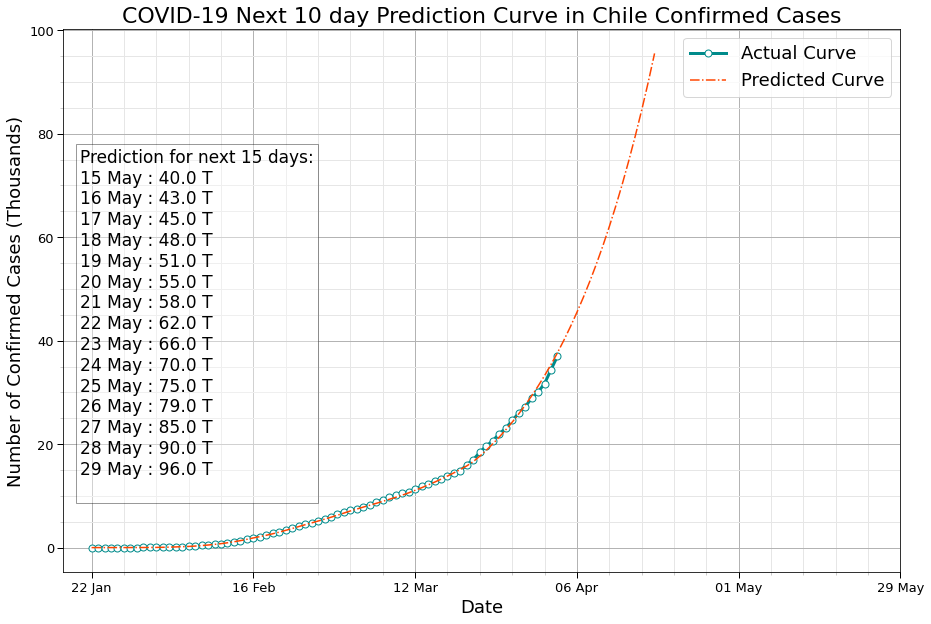

In [237]:
# Predicción para Chile

lakh = 1000
prediction_days = 15

temp_data = df_confirmed[df_confirmed["country"]=="Chile"].iloc[:,5:].sum(axis =0)[41:]
data = np.power(10,model.predict(np.arange(1,len(temp_data)+prediction_days+1)))
f = plt.figure(figsize=(15,10))
ax = f.add_subplot(111)

date = np.arange(0,len(temp_data))

marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=7, markerfacecolor='#ffffff')
plt.plot(date,temp_data/lakh,"-.",color="darkcyan",**marker_style, label="Actual Curve")

date = np.arange(0,len(data))
plt.plot(date,data/lakh,"-.",color="orangered",label="Predicted Curve")

nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total = d + nextdays

text = "Prediction for next "+str(prediction_days) +" days:\n"
for i in range(prediction_days):
    text += nextdays[i]+" : "+str(np.round(data[-1*(prediction_days-i)],-3)[0]/lakh)+" T\n"

plt.text(0.02, 0.78, text, fontsize=17, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),d[:-1:int(len(total)/5)]+[total[-1]])

# Tick-Parameters
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(which='both', width=1,labelsize=14)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=3, color='0.8')

# Grid
plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')
plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')

# Plot Title
plt.title("COVID-19 Next 10 day Prediction Curve in Chile Confirmed Cases",{'fontsize':22})

# Axis Lable
plt.xlabel("Date",fontsize =18)
plt.ylabel("Number of Confirmed Cases (Thousands)",fontsize =18)

# plt.yscale("log")
plt.legend(fontsize =18)
plt.tick_params(labelsize = 13) 
plt.show()

<a id="section5"></a>
<h2>5. Evaluación </h2>
<hr>

En primer lugar es destacable que nos acercamos mucho a nuestro objetivo general, puesto que pudimos generalizar bajo ciertos supuestos la evolución del COVID 19, no obstante aún quedan pendiente varios detalles para tener mas certeza de nuestros resultados.

Una de los posibles aspectos a mejorar es la profundidad en el análisis exploratorio de los datos, comprender un poco más que nos dice la estadísitca descriptiva con respecto a las variables relevantes. También se debe entrar visualizar otras variables no tan directas, tasas o incluso agregar bases de datos para visualizar clusters segun tipos de paciente.

Si bien no evaluamos el modelo en términos de su capacidad para generalizar, esto queda propuesto para quien quiera realizarlo.

Por último un análisis profundo a considerar sería realizar más aperturas de los datos por zonas, como abrir por continentes y países y realizar análisis comparativos con esos datos.

<p><img alt="Curve" width=600 src="https://thespinoff.co.nz/wp-content/uploads/2020/03/Covid-19-curves-graphic-social-v3.gif", align="center", hspace=0, vspace=5></p>

<a id="section6"></a>
<h2>6. Reporte final </h2>
<hr>

Para la construcción del reporte final se consideran todas las fases de este reporte y se comienzan a realizar resumenes descriptivos y documentación contextual con respecto al tema.

Se debe decidir como se entregará el resultado, además de como se ira mejorando este con las iteraciones futuras en las fases de nuestro proyecto.

Una forma de entregar la información hoy en día consiste en la realización de reportes construidos con alguna de las múltiples herramientas existentes (PowerBI, Tableau, DataStudio) como el siguiente <a href="https://datastudio.google.com/u/0/reporting/b1689869-0c59-442c-951d-2991c0fc611d/page/rUZIB">Panel interactivo del COVID19en Chile</a> desarrollado por <a href="https://www.linkedin.com/in/ivangonzalez-msc/">Iván González</a>. 

También de manera anexa se desarrollan presentaciones para presentar los resultados, realizadas estas generalmente en Microsoft PowerPoint u otros compiladores de presentaciones.

A medida se realizan iteraciones se debe ir evaluando si corresponde agregar o no los últimos resultados a la reportería y al resultado final, para ir mejorando nuestras entregas de ser posible.

Para efectos de este análisis, nuestro producto final es este Notebook que nos será válido como reportería, además de quedar documentado como una futura guía para quien quiera realizar un proyecto con datos.